In [230]:
from mpi4py import MPI
import numpy as np
import pylab as plt

import uvtools
import hera_cal as hc
import pyuvdata
from pyuvdata import UVData

from hera_sim.visibilities import VisCPU, conversions
from hera_sim.beams import PolyBeam, PerturbedPolyBeam

import ultranest

try:
    import healpy
    import healvis
except:
    print("Unable to import healpy and/or healvis; diffuse mode unavailable")

#import utils
import time, copy, sys
from numba import jit

# Begin MPI
#if use_mpi:
#    comm = MPI.COMM_WORLD
#    myid = comm.Get_rank()
#else:
#    comm = None
#    myid = 0

In [2]:
def default_cfg():
    """
    Set parameter defaults.
    """
    # Simulation specification
    cfg_spec = dict( nfreq=16,
                     start_freq=1.e8,
                     bandwidth=0.2e8,
                     start_time=2458902.33333,
                     integration_time=40.,
                     ntimes=3,
                     cat_name="gleamegc.dat",
                     apply_gains=True,
                     apply_noise=True,
                     ant_pert=False,
                     seed=None,
                     ant_pert_sigma=0.0,
                     use_legacy_array=False,
                     hex_spec=(3,4), 
                     hex_ants_per_row=None, 
                     hex_ant_sep=14.6,
                     use_ptsrc=True )
                        
    # Diffuse model specification
    cfg_diffuse = dict( use_diffuse=False,
                        nside=64,
                        obs_latitude=-30.7215277777,
                        obs_longitude = 21.4283055554,
                        obs_height = 1073,
                        beam_pol='XX',
                        diffuse_model='GSM',
                        eor_random_seed=42,
                        nprocs=1 )
    
    # Beam model parameters
    cfg_beam = dict( ref_freq=1.e8,
                     spindex=-0.6975,
                     seed=None,
                     perturb_scale=0.0,
                     mainlobe_scale=1.0,
                     xstretch=1.0,
                     ystretch=1.0,
                     xystretch_same=True,
                     xystretch_dist=None,
                     rotation_dist='',
                     rotation=0.0,
                     mainlobe_width=0.3, 
                     nmodes=8,
                     beam_coeffs=[ 0.29778665, -0.44821433, 0.27338272, 
                                  -0.10030698, -0.01195859, 0.06063853, 
                                  -0.04593295,  0.0107879,  0.01390283, 
                                  -0.01881641, -0.00177106, 0.01265177, 
                                  -0.00568299, -0.00333975, 0.00452368,
                                   0.00151808, -0.00593812, 0.00351559
                                 ] )
    
    # Fluctuating gain model parameters
    cfg_gain = dict(nmodes=8, seed=None)
    
    # Noise parameters
    cfg_noise = dict(nsamp=1., seed=None, noise_file=None)
    
    # Combine into single dict
    cfg = { 'sim_beam':     cfg_beam,
            'sim_spec':     cfg_spec,
            'sim_diffuse':  cfg_diffuse,
            'sim_noise':    cfg_noise,
            'sim_gain':     cfg_gain,
           }
    return cfg

In [223]:
class VisModel(object):
    
    def __init__(self, uvd_init, 
                 ptsrc_ra_dec, ptsrc_flux,
                 beam_model=PerturbedPolyBeam, 
                 default_beam_params={},
                 free_params_antpos=[], free_params_beam=[], 
                 free_params_ptsrc=[],
                 free_beams=[], free_ants=[], free_ptsrcs=[],
                 verbose=False, comm=None):
        """
        Construct a model for a set of visibility data from a series 
        of data model components. This object handles caching of 
        results to avoid expensive recomputations where possible.
        
        Parameters
        ----------
        uvd_init : UVData object
            UVData object with the correct data shape (number of 
            frequencies, times, polarisations, antennas).
        
        ptsrc_ra_dec, ptsrc_flux : array_like
            Point source position and flux arrays.
        
        beam_model : UVBeam, optional
            Beam model class to be used for the primary beams.
            Default: PerturbedPolyBeam
        
        default_beam_params : dict
            Default values of all beam model parameters.
        
        free_params_antpos, free_params_beam, free_params_ptsrc : lists of str
            Ordered lists of names of parameters to be varied. 
            The ordering maps to the parameter vector.
        
        free_beams, free_ants, free_ptsrcs : list of int
            Ordered list of which beams/antennas/point sources 
            are to have their parameters varied. The ordering 
            maps to the parameter vector.
        
        verbose : bool, optional
            Whether to print debug messages. Default: True.
        
        comm : MPI communicator, optional
            MPI communicator to be passed to simulator. Default: None.
        """
        # Set basic parameters
        assert isinstance(uvd_init, UVData), "uvd_init must be a valid UVData object"
        self.verbose = verbose
        
        # Store basic data object
        self.uvd = copy.deepcopy(uvd_init)
        
        # General settings
        self._freqs = np.unique(self.uvd.freq_array)
        self._ant_index = self.uvd.antenna_numbers
        
        # Initial antenna positions (for antennas with free positions)
        self.antpos_initial = {}
        for ant in free_ants:
            pos = self.uvd.antenna_positions[np.where(self.uvd.antenna_numbers == ant)]
            self.antpos_initial[ant] = pos.flatten()
        
        # Set beam type
        self.BeamClass = beam_model
        self.beams = [[] for i in range(self.uvd.Nants_data)]
        self.default_beam_params = default_beam_params
        
        # Point source catalogue
        self.ptsrc_ra_dec = ptsrc_ra_dec.copy()
        self.ptsrc_flux = ptsrc_flux.copy()
        self.ptsrc_delta_radec = np.zeros(self.ptsrc_ra_dec.shape)
        self.ptsrc_flux_factor = np.ones(self.ptsrc_ra_dec.shape[0])
        
        # Mappings between param vector and param names
        self.free_params_antpos = free_params_antpos
        self.free_params_beam = free_params_beam
        self.free_params_ptsrc = free_params_ptsrc
        self.free_beams = free_beams
        self.free_ants = free_ants
        self.free_ptsrcs = free_ptsrcs
        
        # MPI handling
        self.comm = comm
        
        # Construct beam model with new parameter values
        for i in range(self.uvd.Nants_data):
            self.beams[i] = self.BeamClass(**self.default_beam_params)
        
        # Model visibility:
        #   Antenna positions
        #   Primary beam models
        #   Sky model: point sources
        #   Sky model: Gaussian sources
        #   Sky model: diffuse
    
    
    def set_antpos(self, ant, params):
        """
        Set position parameters of named antenna.
        
        Parameters
        ----------
        ant : int
            Antenna ID.
        
        params : array_like
            Vector of parameters. Names and ordering are defined 
            in `self.free_params_antpos`.
        """
        # Extract antenna position parameters
        vec = np.zeros(3)
        j = 0
        for i, p in enumerate(['antpos_dx', 'antpos_dy', 'antpos_dz']):
            if p in self.free_params_antpos:
                vec[i] = params[j]
                j += 1
        
        # Update antenna positions
        self.uvd.antenna_positions[ant] = self.antpos_initial[ant] + vec
    
    
    def set_beam(self, ant, params):
        """
        Set the parameters of a beam.
        
        Parameters
        ----------
        ant : int
            Antenna ID.
            
        params : array_like
            Vector of parameters. Names and ordering are defined 
            in `self.free_params_beams`.
        """
        assert len(params) == len(self.free_params_beam)
        
        # Copy default parameter values
        param_dict = copy.copy(self.default_beam_params)
        
        # Update parameter values that have changed
        for i, pname in enumerate(self.free_params_beam):
            param_dict[pname] = params[i]
        
        # Construct beam model with new parameter values
        idx = np.where(self._ant_index == ant)[0][0]
        self.beams[idx] = self.BeamClass(**param_dict)
        # First arg is: perturb_coeffs=[0.,]
    
    
    def set_ptsrc_params(self, i, params):
        """
        Set the parameters of a point source.
        
        Parameters
        ----------
        i : int
            Point source index in the catalogue.
            
        params : array_like
            Vector of parameters. Names and ordering are defined 
            in `self.free_params_ptsrcs`.
        """
        # Set point source parameters if specified
        if 'delta_ra' in self.free_params_ptsrc:
            self.ptsrc_delta_radec[i][0] = params[self.free_params_ptsrc.index('delta_ra')]
        if 'delta_dec' in self.free_params_ptsrc:
            self.ptsrc_delta_radec[i][1] = params[self.free_params_ptsrc.index('delta_dec')]
        if 'flux_factor' in self.free_params_ptsrc:
            self.ptsrc_flux_factor[i] = params[self.free_params_ptsrc.index('flux_factor')]
    
    
    def param_names(self):
        """
        Return list of parameter names in order.
        """
        pnames = []
        
        # Antenna position parameters
        for ant in self.free_ants:
            for p in self.free_params_antpos:
                pnames.append("%s_%03d" % (p, ant))
        
        # Beam parameters
        for ant in self.free_beams:
            for p in self.free_params_beam:
                pnames.append("%s_%03d" % (p, ant))
        
        # Point source parameters
        for i in self.free_ptsrcs:
            for p in self.free_params_ptsrc:
                pnames.append("%s_%06d" % (p, i))
        
        return pnames
    
    
    def simulate(self):
        """
        Simulate visibilities for the current state of the model.
        """
        # Need to zero the array, which is usually returned by 
        # reference rather than copied
        self.uvd.data_array *= 0.
        
        # Construct new simulator class with updated settings
        simulator = VisCPU(
            uvdata=self.uvd,                          # fixed
            beams=self.beams,                         # varies
            beam_ids=self._ant_index,                 # fixed
            sky_freqs=self._freqs,                    # fixed
            point_source_pos=self.ptsrc_ra_dec + self.ptsrc_delta_radec, # varies
            point_source_flux=self.ptsrc_flux * self.ptsrc_flux_factor,  # varies
            precision=2,                              # fixed
            use_pixel_beams=False, # Do not use pixel beams
            bm_pix=10,
            mpi_comm=self.comm
        )
        
        # Run simulation
        if self.verbose:
            print("  Beginning simulation")
        tstart = time.time()
        simulator.simulate()
        if self.verbose:
            print("  Simulation took %2.1f sec" % (time.time() - tstart))
    
        #if myid != 0:
        #    # Wait for root worker to finish IO before ending all other worker procs
        #    comm.Barrier()
        #    sys.exit(0)
        
        return simulator.uvdata
    
    
    def model(self, params):
        """
        Calculate model visibilities for a given parameter vector.
        
        Parameters
        ----------
        params : array_like
            Vector of parameter values. The number of parameters 
            and position of each parameter in the vector must 
            follow the specification 
        """
        params = np.array(params)
        
        # Count free parameters and antennas/beams
        Nfree_ants = len(self.free_ants)
        Nfree_beams = len(self.free_beams)
        Nfree_ptsrcs = len(self.free_ptsrcs)
        Nparams_ants = len(self.free_params_antpos)
        Nparams_beams = len(self.free_params_beam)
        Nparams_ptsrcs = len(self.free_params_ptsrc)
        
        # Extract parameters in blocks and reshape
        iants = Nfree_ants * Nparams_ants
        ibeams = Nfree_beams * Nparams_beams
        iptsrcs = Nfree_ptsrcs * Nparams_ptsrcs
        antpos_params = params[0:iants].reshape((Nfree_ants, Nparams_ants))
        beam_params = params[iants:iants+ibeams].reshape((Nfree_beams, Nparams_beams))
        ptsrc_params = params[iants+ibeams:iants+ibeams+iptsrcs].reshape((Nfree_ptsrcs, Nparams_ptsrcs))
        
        # (1) Antenna positions
        for i, ant in enumerate(self.free_ants):
            self.set_antpos(ant, antpos_params[i])
        
        # (2) Beam parameters
        for i, ant in enumerate(self.free_beams):
            self.set_beam(ant, beam_params[i])
        
        # (3) Point source parameters
        for i in self.free_ptsrcs:
            self.set_ptsrc_params(i, ptsrc_params[i])
        
        # Run simulation
        _uvd = self.simulate()
        self.uvd = _uvd
        return _uvd

In [4]:
# Load template configuration
cfg = default_cfg()
cfg_spec = cfg['sim_spec']

# Initialise shape of data and antenna array
ants = utils.build_hex_array(hex_spec=cfg_spec['hex_spec'], 
                             ants_per_row=cfg_spec['hex_ants_per_row'], 
                             d=cfg_spec['hex_ant_sep'])
uvd_init = utils.empty_uvdata(ants=ants, **cfg_spec)

# Point source catalogue
ra_dec, flux = utils.load_ptsrc_catalog('../non-redundant-pipeline/catBC.txt', 
                                        freq0=100e6, freqs=np.unique(uvd_init.freq_array), 
                                        usecols=(0,1,2,3))

In [171]:
model = VisModel(uvd_init, 
                 ra_dec[:100], flux[:,:100],
                 beam_model=PerturbedPolyBeam, 
                 default_beam_params=cfg['sim_beam'],
                 free_params_antpos=['antpos_dx', 'antpos_dy'], free_params_beam=['mainlobe_scale'], 
                 free_beams=np.arange(10), free_ants=np.arange(10),
                 comm=None)

In [172]:
uvd_init.antenna_numbers

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [173]:
# Initial values
init_beams = np.ones(10)
init_antpos = np.zeros(10*2)

init_vals = np.concatenate((init_antpos, init_beams))
print(init_vals)
print(model.param_names())

[ -0.67895712 -15.95062793  -6.0128728   -2.35984637 -11.34678848
  11.2309352    8.00087352 -20.38617235   2.66695784  -6.79539078
  -2.66695784   6.79539078  -8.00087352  20.38617235  11.34678848
 -11.2309352    6.0128728    2.35984637   0.67895712  15.95062793
   1.           1.           1.           1.           1.
   1.           1.           1.           1.           1.        ]
['antpos_x_000', 'antpos_y_000', 'antpos_x_001', 'antpos_y_001', 'antpos_x_002', 'antpos_y_002', 'antpos_x_003', 'antpos_y_003', 'antpos_x_004', 'antpos_y_004', 'antpos_x_005', 'antpos_y_005', 'antpos_x_006', 'antpos_y_006', 'antpos_x_007', 'antpos_y_007', 'antpos_x_008', 'antpos_y_008', 'antpos_x_009', 'antpos_y_009', 'mainlobe_scale_000', 'mainlobe_scale_001', 'mainlobe_scale_002', 'mainlobe_scale_003', 'mainlobe_scale_004', 'mainlobe_scale_005', 'mainlobe_scale_006', 'mainlobe_scale_007', 'mainlobe_scale_008', 'mainlobe_scale_009']


In [8]:
model.model(init_vals)
model.uvd.get_data((0,1))

array([[-1.28508988-7.48746486j, -1.37242975-7.44893823j,
        -1.46062567-7.42687151j, -1.55706063-7.42140205j,
        -1.66887225-7.42979853j, -1.8019322 -7.44673869j,
        -1.95999763-7.46492491j, -2.14413943-7.47595232j,
        -2.35251377-7.47131359j, -2.58049834-7.44341101j,
        -2.82116754-7.38644898j, -3.06603913-7.29709884j,
        -3.30599249-7.17486035j, -3.53224047-7.02208478j,
        -3.73723394-6.84366834j, -3.91539161-6.64646632j],
       [-1.82103029-7.22178039j, -1.90657637-7.17252872j,
        -1.9930254 -7.13927506j, -2.08762003-7.12207335j,
        -2.19733861-7.1181494j , -2.32788543-7.12218125j,
        -2.48285295-7.12691496j, -2.66316028-7.12403023j,
        -2.86683395-7.10514079j, -3.08915177-7.06280024j,
        -3.32312422-6.9913869j , -3.56024542-6.88776013j,
        -3.7914138 -6.7516125j , -4.00790438-6.58548337j,
        -4.20227197-6.39444293j, -4.3690775 -6.18549714j],
       [-2.32346184-6.91754848j, -2.40603251-6.85794396j,
        -2.4

In [9]:
_uvd = model.simulate()
model.uvd.get_data((0,1))

array([[-1.28508988-7.48746486j, -1.37242975-7.44893823j,
        -1.46062567-7.42687151j, -1.55706063-7.42140205j,
        -1.66887225-7.42979853j, -1.8019322 -7.44673869j,
        -1.95999763-7.46492491j, -2.14413943-7.47595232j,
        -2.35251377-7.47131359j, -2.58049834-7.44341101j,
        -2.82116754-7.38644898j, -3.06603913-7.29709884j,
        -3.30599249-7.17486035j, -3.53224047-7.02208478j,
        -3.73723394-6.84366834j, -3.91539161-6.64646632j],
       [-1.82103029-7.22178039j, -1.90657637-7.17252872j,
        -1.9930254 -7.13927506j, -2.08762003-7.12207335j,
        -2.19733861-7.1181494j , -2.32788543-7.12218125j,
        -2.48285295-7.12691496j, -2.66316028-7.12403023j,
        -2.86683395-7.10514079j, -3.08915177-7.06280024j,
        -3.32312422-6.9913869j , -3.56024542-6.88776013j,
        -3.7914138 -6.7516125j , -4.00790438-6.58548337j,
        -4.20227197-6.39444293j, -4.3690775 -6.18549714j],
       [-2.32346184-6.91754848j, -2.40603251-6.85794396j,
        -2.4

## Likelihood and sampling

In [220]:
class VisLike(object):
    """
    Manage likelihood calculations for a set of visibility data.
    """
    
    def __init__(self, data, model, var):
        """
        Object to handle likelihood evaluation.
        
        Parameters
        ----------
        data : UVData object
            Object containing data.
        
        model : VisModel object
            Object containing model spec.
        
        var : float
            Noise variance. For now, this is just a constant float.
        """
        assert isinstance(data, UVData), "data must be an instance of UVData"
        assert isinstance(model, VisModel), "model must be an instance of VisModel"
        self.data = data
        self.model = model
        self.var = var
        
        # Validate shape of data and model
        self.validate()
    
    
    def prior_cube(self, cube, init_vals):
        """
        Return prior in the form of a cube for ultranest.
        """
        trans_params = np.empty_like(cube)
        
        pnames = self.model.param_names()
        for i, pn in enumerate(pnames):
            
            # Antenna positions
            if 'antpos_dx' in pn or 'antpos_dy' in pn or 'antpos_dz' in pn:
                vmin = init_vals[i] - 0.02
                vmax = init_vals[i] + 0.02
                trans_params[i] = vmin + (vmax - vmin) * cube[i] # Uniform distribution
            
            # Beam parameters
            if 'mainlobe_scale' in pn:
                vmin = 0.95
                vmax = 1.05
                trans_params[i] = vmin + (vmax - vmin) * cube[i] # Uniform distribution
            
        return trans_params
    
    
    def validate(self):
        """
        Check that data and model have the same shape.
        """
        assert self.model.uvd.data_array.shape == self.data.data_array.shape, \
            "Model and data have different shape"
    
    
    def logl(self, params):
        """
        Calculate the log-likelihood.
        """
        model = self.model.model(params)
        flags = ~self.data.flag_array
        logl = -0.5 * flags*np.abs(self.data.data_array - model.data_array)**2. / self.var \
               -0.5 * np.log(2.*np.pi*self.var) * self.data.data_array.size
        return np.sum(logl)

In [64]:
# Generate model + noise
np.random.seed(7)
var = 0.5
data = copy.deepcopy(model.model(init_vals))
#print(data.data_array)
data.data_array += np.sqrt(var) \
                     * (  1.0*np.random.randn(*data.data_array.shape) 
                        + 1.j*0.*np.random.randn(*data.data_array.shape) ) # FIXME

# Create likelihood handler object
like = VisLike(data, model, var=var)

In [65]:
print( like.logl(init_vals) )
print(data.data_array.size)

-3990457.4869925566
2640


In [66]:
#data.data_array.imag/model.model(init_vals).data_array.imag - 1.

In [67]:
pnames = model.param_names()
likefn = lambda p: like.logl(p)
prior = lambda cube: like.prior_cube(cube, init_vals)

# Create sampler
sampler = ultranest.ReactiveNestedSampler(pnames, likefn, prior)

In [75]:
res = sampler.run(max_ncalls=50000, min_num_live_points=80)

[ultranest] Widening roots to 80 live points (have 80 already) ...


Sampling from region seems inefficient (0/40 accepted in iteration 2500). To improve efficiency, modify the transformation so that the current live points are ellipsoidal, or use a stepsampler, or set frac_remain to a lower number (e.g., 0.5) to terminate earlier.


[ultranest] Explored until L=-4e+06  21..-3990456.06 [-3990462.0925..-3990458.8956] | it/evals=938/50131 eff=0.6724% N=80 
[ultranest] Likelihood function evaluations: 50131
[ultranest] Reached maximum number of likelihood calls (50131 > 50000)...
[ultranest] done iterating.


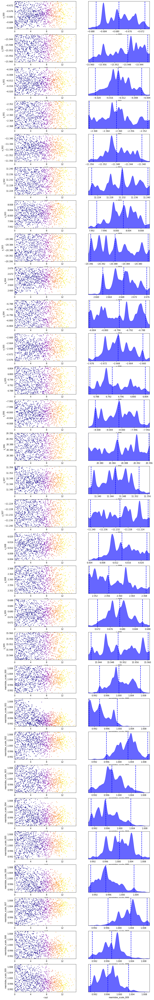

In [76]:
sampler.plot_trace()

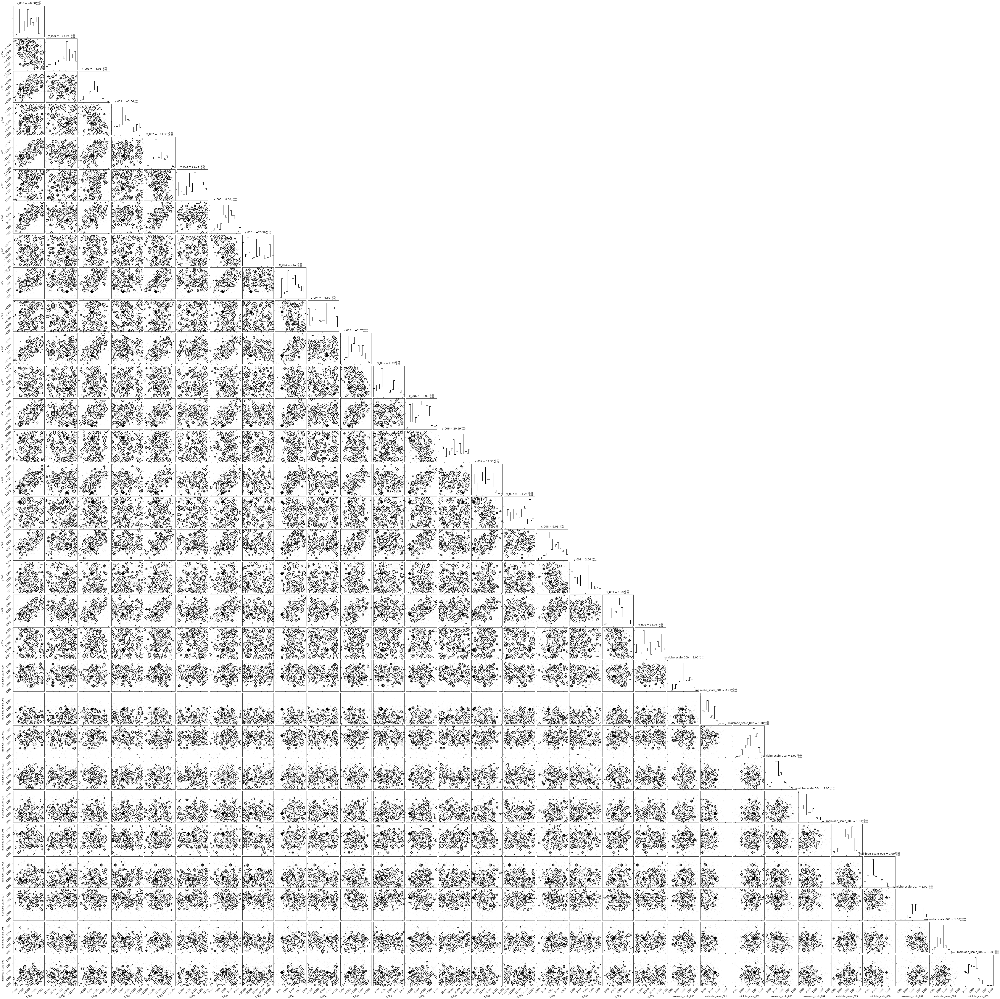

In [77]:
sampler.plot_corner()

In [71]:
for i in range(init_vals.size):
    print("%30s  %+12.6f  %+12.6f" % (pnames[i], init_vals[i], res['posterior']['mean'][i]))

                         x_000     -0.678957     -0.679020
                         y_000    -15.950628    -15.948100
                         x_001     -6.012873     -6.011787
                         y_001     -2.359846     -2.361838
                         x_002    -11.346788    -11.347148
                         y_002    +11.230935    +11.232369
                         x_003     +8.000874     +8.003034
                         y_003    -20.386172    -20.387136
                         x_004     +2.666958     +2.668941
                         y_004     -6.795391     -6.792888
                         x_005     -2.666958     -2.665245
                         y_005     +6.795391     +6.794212
                         x_006     -8.000874     -8.000632
                         y_006    +20.386172    +20.385230
                         x_007    +11.346788    +11.347059
                         y_007    -11.230935    -11.231465
                         x_008     +6.012873     +6.0155

In [18]:
res.keys()

dict_keys(['niter', 'logz', 'logzerr', 'logz_bs', 'logz_single', 'logzerr_tail', 'logzerr_bs', 'ess', 'H', 'Herr', 'posterior', 'weighted_samples', 'samples', 'maximum_likelihood', 'ncall', 'paramnames', 'logzerr_single', 'insertion_order_MWW_test'])

In [19]:
from ultranest.plot import cornerplot
cornerplot(res)
plt.show()

In [20]:
import pandas as pd
df = pd.DataFrame(data=res['samples'], columns=res['paramnames'])
df.describe()

,x_000,y_000,x_001,y_001,x_002,y_002,x_003,y_003,x_004,y_004,...,mainlobe_scale_000,mainlobe_scale_001,mainlobe_scale_002,mainlobe_scale_003,mainlobe_scale_004,mainlobe_scale_005,mainlobe_scale_006,mainlobe_scale_007,mainlobe_scale_008,mainlobe_scale_009
count,6.910000e+02,6.910000e+02,6.910000e+02,6.910000e+02,6.910000e+02,6.910000e+02,6.910000e+02,6.910000e+02,6.910000e+02,6.910000e+02,...,6.910000e+02,6.910000e+02,6.910000e+02,6.910000e+02,6.910000e+02,6.910000e+02,6.910000e+02,6.910000e+02,6.910000e+02,6.910000e+02
mean,-6.865580e-01,-1.594510e+01,-6.019388e+00,-2.366191e+00,-1.134967e+01,1.122237e+01,7.995453e+00,-2.038341e+01,2.670873e+00,-6.800365e+00,...,9.852547e-01,1.003302e+00,1.002893e+00,1.006465e+00,9.983477e-01,1.006797e+00,9.992308e-01,1.005503e+00,1.011810e+00,9.990969e-01
std,6.221753e-15,1.973184e-13,3.821934e-14,3.333082e-14,9.421511e-14,9.065982e-14,5.510695e-14,1.315456e-13,3.199758e-14,1.955408e-14,...,6.110650e-15,1.422115e-14,8.666012e-15,1.244351e-14,1.166579e-14,1.111027e-15,9.221526e-15,9.554834e-15,7.999396e-15,2.888671e-15
min,-6.865580e-01,-1.594510e+01,-6.019388e+00,-2.366191e+00,-1.134967e+01,1.122237e+01,7.995453e+00,-2.038341e+01,2.670873e+00,-6.800365e+00,...,9.852547e-01,1.003302e+00,1.002893e+00,1.006465e+00,9.983477e-01,1.006797e+00,9.992308e-01,1.005503e+00,1.011810e+00,9.990969e-01
25%,-6.865580e-01,-1.594510e+01,-6.019388e+00,-2.366191e+00,-1.134967e+01,1.122237e+01,7.995453e+00,-2.038341e+01,2.670873e+00,-6.800365e+00,...,9.852547e-01,1.003302e+00,1.002893e+00,1.006465e+00,9.983477e-01,1.006797e+00,9.992308e-01,1.005503e+00,1.011810e+00,9.990969e-01
50%,-6.865580e-01,-1.594510e+01,-6.019388e+00,-2.366191e+00,-1.134967e+01,1.122237e+01,7.995453e+00,-2.038341e+01,2.670873e+00,-6.800365e+00,...,9.852547e-01,1.003302e+00,1.002893e+00,1.006465e+00,9.983477e-01,1.006797e+00,9.992308e-01,1.005503e+00,1.011810e+00,9.990969e-01
75%,-6.865580e-01,-1.594510e+01,-6.019388e+00,-2.366191e+00,-1.134967e+01,1.122237e+01,7.995453e+00,-2.038341e+01,2.670873e+00,-6.800365e+00,...,9.852547e-01,1.003302e+00,1.002893e+00,1.006465e+00,9.983477e-01,1.006797e+00,9.992308e-01,1.005503e+00,1.011810e+00,9.990969e-01
max,-6.865580e-01,-1.594510e+01,-6.019388e+00,-2.366191e+00,-1.134967e+01,1.122237e+01,7.995453e+00,-2.038341e+01,2.670873e+00,-6.800365e+00,...,9.852547e-01,1.003302e+00,1.002893e+00,1.006465e+00,9.983477e-01,1.006797e+00,9.992308e-01,1.005503e+00,1.011810e+00,9.990969e-01


In [21]:
pnames

['x_000',
 'y_000',
 'x_001',
 'y_001',
 'x_002',
 'y_002',
 'x_003',
 'y_003',
 'x_004',
 'y_004',
 'x_005',
 'y_005',
 'x_006',
 'y_006',
 'x_007',
 'y_007',
 'x_008',
 'y_008',
 'x_009',
 'y_009',
 'mainlobe_scale_000',
 'mainlobe_scale_001',
 'mainlobe_scale_002',
 'mainlobe_scale_003',
 'mainlobe_scale_004',
 'mainlobe_scale_005',
 'mainlobe_scale_006',
 'mainlobe_scale_007',
 'mainlobe_scale_008',
 'mainlobe_scale_009']

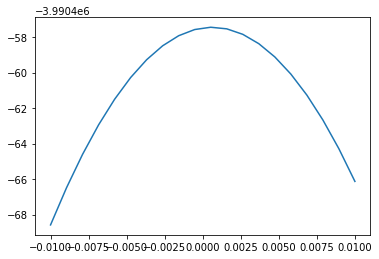

In [94]:
#like.logl(p)
v = init_vals.copy()
dx = np.linspace(-0.01, 0.01, 20)
#pnames

ll = []
for _dx in dx:
    vi = v.copy()
    vi[0] += _dx
    ll.append(like.logl(vi))

plt.plot(dx, ll)

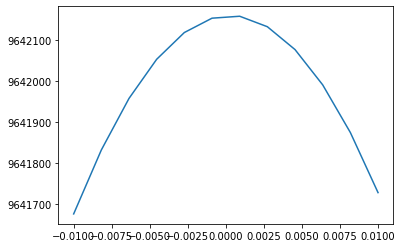

In [23]:
#like.logl(p)
v = init_vals.copy()
dm = np.linspace(-0.01, 0.01, 12)
#pnames

ll = []
for _dm in dm:
    vi = v.copy()
    vi[8] += _dm
    ll.append(like.logl(vi))

plt.plot(dm, ll)

# Fisher matrix

In [134]:
def calc_fisher(model, fiducial, dx=0.01, verbose=True):
    """
    Calculate Fisher matrix from a model.
    
    Parameters
    ----------
    model : VisModel object
        Contains model spec.
    
    fiducial : array_like
        Fiducial vector of model parameters, in the 
        same ordering as `model.param_names()`.
    
    dx : float, optional
        Finite difference for all parameters. Default: 0.01.
    
    verbose : bool, optional
        Whether to print debug messages. Default: True.
    
    Returns
    -------
    fisher : array_like
        Fisher matrix.
    """
    pnames = model.param_names()
    assert len(pnames) == len(fiducial), \
        "Fiducial parameter vector has different size to expected number of parameters"
    
    # Fisher matrix and fiducial parameter vector
    F = np.zeros((len(pnames), len(pnames)))
    fid = fiducial.copy()
    
    # Loop over parameters
    for i in range(len(pnames)):
        if verbose:
            print("%d / %d" % (i, len(pnames)))

        # i derivative
        vmi = fid.copy()
        vpi = fid.copy()
        vmi[i] = vmi[i] - dx
        vpi[i] = vpi[i] + dx
        model_p = model.model(vpi).copy()
        model_m = model.model(vmi).copy()
        dmodel_dxi = (model_p.data_array - model_m.data_array) / (2.*dx)

        for j in range(i, len(pnames)):

            # j derivative
            vmj, vpj = fid.copy(), fid.copy()
            vmj[j] -= dx
            vpj[j] += dx
            model_pj = model.model(vpj).copy()
            model_mj = model.model(vmj).copy()
            dmodel_dxj = (model_pj.data_array - model_mj.data_array) / (2.*dx)

            # Calculate Fisher matrix element
            F[i,j] = F[j,i] = np.sum( (dmodel_dxi.real * dmodel_dxj.real + dmodel_dxi.imag * dmodel_dxj.imag) / var )
    
    return F

In [240]:
def calc_fisher_bigmem(model, fiducial, dx=0.01, verbose=True):
    """
    Calculate Fisher matrix from a model. Stores the derivatives 
    in memory for faster computation (but uses much more memory).
    
    Parameters
    ----------
    model : VisModel object
        Contains model spec.
    
    fiducial : array_like
        Fiducial vector of model parameters, in the 
        same ordering as `model.param_names()`.
    
    dx : float, optional
        Finite difference for all parameters. Default: 0.01.
    
    verbose : bool, optional
        Whether to print debug messages. Default: True.
    
    Returns
    -------
    fisher : array_like
        Fisher matrix.
    """
    pnames = model.param_names()
    assert len(pnames) == len(fiducial), \
        "Fiducial parameter vector has different size to expected number of parameters"
    
    # Fisher matrix and fiducial parameter vector
    F = np.zeros((len(pnames), len(pnames)))
    fid = fiducial.copy()
    dmodel_dx = []
    
    # Loop over parameters to get derivatives
    for i in range(len(pnames)):
        if verbose:
            print("%d / %d" % (i, len(pnames)))

        # i derivative
        vmi = fid.copy()
        vpi = fid.copy()
        vmi[i] = vmi[i] - dx
        vpi[i] = vpi[i] + dx
        model_p = model.model(vpi).copy()
        model_m = model.model(vmi).copy()
        dmodel_dxi = (model_p.data_array - model_m.data_array) / (2.*dx)
        dmodel_dx.append(dmodel_dxi)
    
    # Loop over pairs of derivatives to calculate Fisher matrix
    for i in range(len(pnames)):
        dmodel_dxi = dmodel_dx[i]
        for j in range(i, len(pnames)):
            dmodel_dxj = dmodel_dx[j]

            # Calculate Fisher matrix element
            F[i,j] = F[j,i] = np.sum( (dmodel_dxi.real * dmodel_dxj.real + dmodel_dxi.imag * dmodel_dxj.imag) / var )
    
    return F

In [232]:
def fisher_prior(pnames, priors):
    """
    Return Fisher matrix prior for a set of parameters of 
    different types.
    
    Parameters
    ----------
    pnames : list of str
        Ordered list of parameter names.
    
    priors : dict of float
        Dictionary containing sigma values for each 
        type of parameter.
    
    Returns
    -------
    Fprior : array_like
        Prior Fisher matrix.
    """
    Fprior = np.zeros((len(pnames), len(pnames)))
    sigma_vals = np.zeros(len(pnames))
    
    # Loop over parameter types
    for i in range(sigma_vals.size):
        for key in priors.keys():
            if key in pnames[i]:
                sigma_vals[i] = priors[key]
    
    # Put into prior matrix
    Fprior[np.diag_indices(Fprior.shape[0])] = 1. / sigma_vals**2.
    return Fprior

In [241]:
t0 = time.time()
F = calc_fisher_bigmem(model, init_vals, dx=0.01, verbose=True)
print("Run took %3.3f sec" % (time.time() - t0))

0 / 30
1 / 30
2 / 30
3 / 30
4 / 30
5 / 30
6 / 30
7 / 30
8 / 30
9 / 30
10 / 30
11 / 30
12 / 30
13 / 30
14 / 30
15 / 30
16 / 30
17 / 30
18 / 30
19 / 30
20 / 30
21 / 30
22 / 30
23 / 30
24 / 30
25 / 30
26 / 30
27 / 30
28 / 30
29 / 30
Run took 3.598 sec


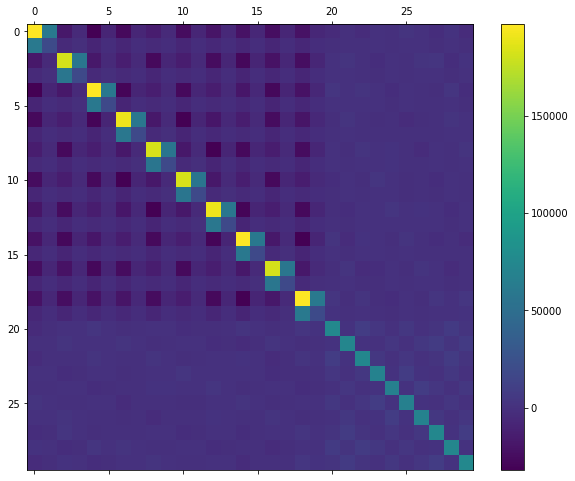

In [115]:
plt.matshow(F, aspect='auto')
plt.colorbar()
plt.gcf().set_size_inches((10., 8.))

In [132]:
sigma = np.sqrt(np.diag(np.linalg.pinv(F)))
for i in range(init_vals.size):
    print("%30s  %+12.6f +/- %8.6f" % (pnames[i], init_vals[i], sigma[i]))

                         x_000     -0.678957 +/- 0.011650
                         y_000    -15.950628 +/- 0.037562
                         x_001     -6.012873 +/- 0.012254
                         y_001     -2.359846 +/- 0.038356
                         x_002    -11.346788 +/- 0.011726
                         y_002    +11.230935 +/- 0.038058
                         x_003     +8.000874 +/- 0.011832
                         y_003    -20.386172 +/- 0.038119
                         x_004     +2.666958 +/- 0.010616
                         y_004     -6.795391 +/- 0.033480
                         x_005     -2.666958 +/- 0.010616
                         y_005     +6.795391 +/- 0.033480
                         x_006     -8.000874 +/- 0.011832
                         y_006    +20.386172 +/- 0.038119
                         x_007    +11.346788 +/- 0.011726
                         y_007    -11.230935 +/- 0.038058
                         x_008     +6.012873 +/- 0.012254
              

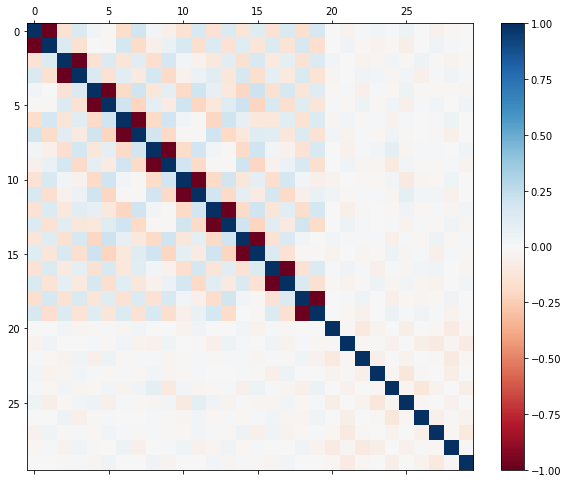

In [129]:
def corrmat(m):
    rho = np.zeros(m.shape)
    for i in range(m.shape[0]):
        for j in range(m.shape[1]):
            rho[i,j] = m[i,j] / np.sqrt(m[i,i]*m[j,j])
    return rho

plt.matshow(corrmat(np.linalg.pinv(F)), aspect='auto', vmin=-1., vmax=1., cmap='RdBu')
plt.colorbar()
plt.gcf().set_size_inches((10., 8.))

# Initialisation

In [24]:
def construct_initial_vector(config, free_params):
    """
    
    Parameters
    ----------
    config : dict
        Dictionary containing initial and default parameters.
    
    free_params : list of str
        List of parameter names (ordered), for parameters 
        that will be varied.
    
    Returns
    -------
    vec : array_like
        Vector of parameter values for parameters that will 
        be varied.
    """
    return np.array([config[p] for p in free_params])

In [224]:
# Load template configuration
cfgX = default_cfg()
cfg_specX = cfgX['sim_spec']

cfg_specX['ntimes'] = 3
Nfree_ptsrc = 50

# Initialise shape of data and antenna array
antsX = utils.build_hex_array(hex_spec=cfg_specX['hex_spec'], 
                              ants_per_row=cfg_specX['hex_ants_per_row'], 
                              d=cfg_specX['hex_ant_sep'])
uvd_initX = utils.empty_uvdata(ants=antsX, **cfg_specX)        

modelX = VisModel(uvd_initX, 
                  ra_dec[:100], flux[:,:100],
                  beam_model=PerturbedPolyBeam, 
                  default_beam_params=cfgX['sim_beam'],
                  free_params_antpos=['antpos_dx', 'antpos_dy', 'antpos_dz'],
                  free_params_beam=['xstretch', 'ystretch', 'spectral_index'], # 'mainlobe_scale'
                  free_params_ptsrc=['delta_ra', 'delta_dec', 'flux_factor'],
                  free_beams=np.arange(10),
                  free_ants=np.arange(10),
                  free_ptsrcs=np.arange(Nfree_ptsrc),
                  comm=None)

# Initial values
init_beamsX = np.ones(3*10)
init_beamsX[2::3] *= -0.6975

init_antposX = np.zeros(3*10)
init_ptsrcX = np.array([0.,0.,1.]*Nfree_ptsrc)

# Combine into initial parameter vector
pnamesX = modelX.param_names()
init_valsX = np.concatenate((init_antposX, init_beamsX, init_ptsrcX))
print(init_valsX)
print(modelX.param_names())

FX = calc_fisher_bigmem(modelX, init_valsX, dx=0.005, verbose=True)

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      1.      1.     -0.6975  1.      1.     -0.6975
  1.      1.     -0.6975  1.      1.     -0.6975  1.      1.     -0.6975
  1.      1.     -0.6975  1.      1.     -0.6975  1.      1.     -0.6975
  1.      1.     -0.6975  1.      1.     -0.6975  0.      0.      1.
  0.      0.      1.      0.      0.      1.      0.      0.      1.
  0.      0.      1.      0.      0.      1.      0.      0.      1.
  0.      0.      1.      0.      0.      1.      0.      0.      1.
  0.      0.      1.      0.      0.      1.      0.      0.      1.
  0.      0.      1.      0.      0.      1.      0.      0.      1.
  0.      0.      1.      0.      0.      1.      0.      0.      1.
  0.      0.      1.      0.      0.      1.      0.      0.      1.
  0.      0.      1.  

In [225]:
# Build Fisher prior
priorsX = {
    'antpos_dx':        0.05,
    'antpos_dy':        0.05,
    'antpos_dz':        0.05,
    'mainlobe_scale':  0.10,
    'xstretch':        0.10,
    'ystretch':        0.10,
    'spectral_index':  0.10,
    'delta_ra':        0.10,
    'delta_dec':       0.10,
    'flux_factor':     0.05,
}

FpriorX = fisher_prior(pnamesX, priorsX)
print(np.diag(FpriorX))

[400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400.
 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400.
 400. 400. 100. 100. 100. 100. 100. 100. 100. 100. 100. 100. 100. 100.
 100. 100. 100. 100. 100. 100. 100. 100. 100. 100. 100. 100. 100. 100.
 100. 100. 100. 100. 100. 100. 400. 100. 100. 400. 100. 100. 400. 100.
 100. 400. 100. 100. 400. 100. 100. 400. 100. 100. 400. 100. 100. 400.
 100. 100. 400. 100. 100. 400. 100. 100. 400. 100. 100. 400. 100. 100.
 400. 100. 100. 400. 100. 100. 400. 100. 100. 400. 100. 100. 400. 100.
 100. 400. 100. 100. 400. 100. 100. 400. 100. 100. 400. 100. 100. 400.
 100. 100. 400. 100. 100. 400. 100. 100. 400. 100. 100. 400. 100. 100.
 400. 100. 100. 400. 100. 100. 400. 100. 100. 400. 100. 100. 400. 100.
 100. 400. 100. 100. 400. 100. 100. 400. 100. 100. 400. 100. 100. 400.
 100. 100. 400. 100. 100. 400. 100. 100. 400. 100. 100. 400. 100. 100.
 400. 100. 100. 400. 100. 100. 400. 100. 100. 400. 100. 100. 400. 100.
 100. 

In [226]:
pnamesX = modelX.param_names()
sigmaX = np.sqrt(np.diag(np.linalg.pinv(FX + FpriorX)))
for i in range(init_valsX.size):
    print("%30s  %+12.6f +/- %8.6f" % (pnamesX[i], init_valsX[i], sigmaX[i]))

                 antpos_dx_000     +0.000000 +/- 0.030342
                 antpos_dy_000     +0.000000 +/- 0.037641
                 antpos_dz_000     +0.000000 +/- 0.033607
                 antpos_dx_001     +0.000000 +/- 0.030329
                 antpos_dy_001     +0.000000 +/- 0.038227
                 antpos_dz_001     +0.000000 +/- 0.032491
                 antpos_dx_002     +0.000000 +/- 0.030823
                 antpos_dy_002     +0.000000 +/- 0.039012
                 antpos_dz_002     +0.000000 +/- 0.033909
                 antpos_dx_003     +0.000000 +/- 0.030727
                 antpos_dy_003     +0.000000 +/- 0.038046
                 antpos_dz_003     +0.000000 +/- 0.034155
                 antpos_dx_004     +0.000000 +/- 0.029707
                 antpos_dy_004     +0.000000 +/- 0.035213
                 antpos_dz_004     +0.000000 +/- 0.031725
                 antpos_dx_005     +0.000000 +/- 0.029707
                 antpos_dy_005     +0.000000 +/- 0.035213
              

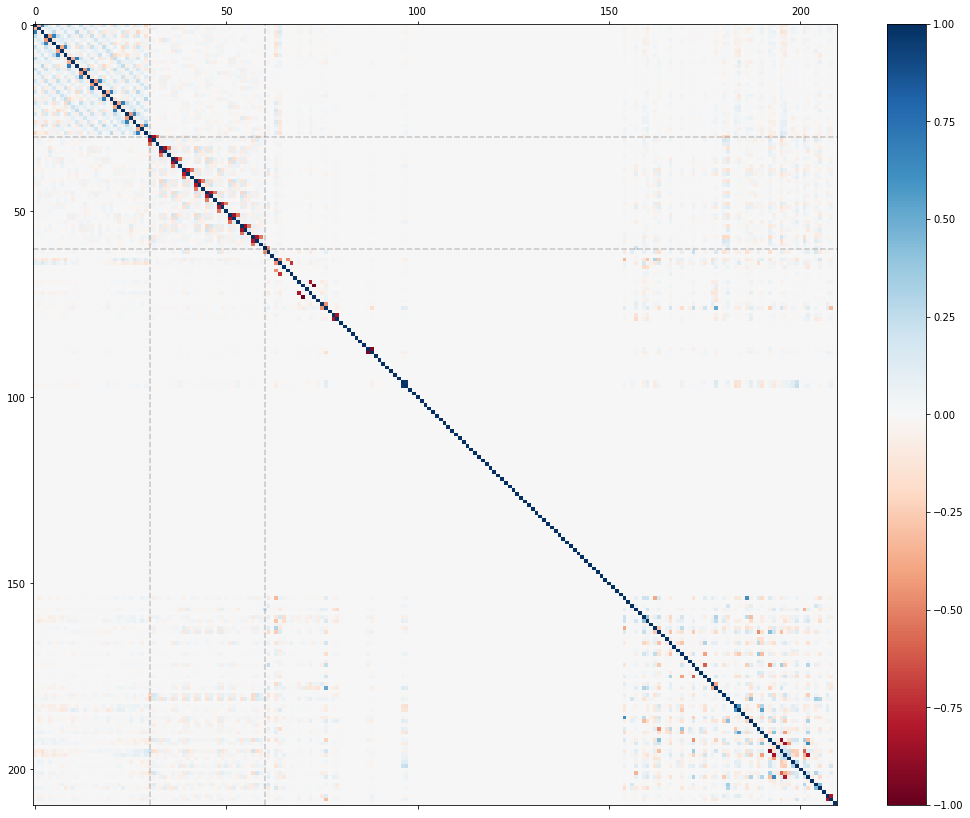

In [227]:
plt.matshow(corrmat(np.linalg.pinv(FX + FpriorX)), aspect='auto', vmin=-1., vmax=1., cmap='RdBu')

# Plot dividing lines for blocks of parameters
for i in [3*10, 3*10+3*10]:
    plt.axhline(i, color='k', ls='dashed', alpha=0.2)
    plt.axvline(i, color='k', ls='dashed', alpha=0.2)
plt.colorbar()
plt.gcf().set_size_inches((18., 14.))

Casting complex values to real discards the imaginary part


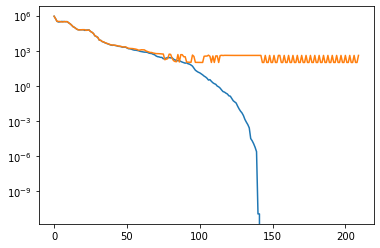

In [228]:
plt.plot(np.linalg.eigvals(FX))
plt.plot(np.linalg.eigvals(FX + FpriorX))
plt.axhline(0., color='k', ls='dashed')
plt.yscale('log')

xstretch_000 0.014083728418933619
ystretch_000 0.017470742995448176
xstretch_001 0.015718120545724263
ystretch_001 0.019430760478926702
xstretch_002 0.015093601844334625
ystretch_002 0.01861200964231428
xstretch_003 0.0134356576551918
ystretch_003 0.016434441713873593
xstretch_004 0.013621701153276974
ystretch_004 0.016654694346644995
xstretch_005 0.01362170115327677
ystretch_005 0.01665469434664497
xstretch_006 0.013435657655191655
ystretch_006 0.016434441713873697
xstretch_007 0.015093601844334848
ystretch_007 0.01861200964231423
xstretch_008 0.015718120545724253
ystretch_008 0.019430760478926567
xstretch_009 0.01408372841893351
ystretch_009 0.017470742995448107


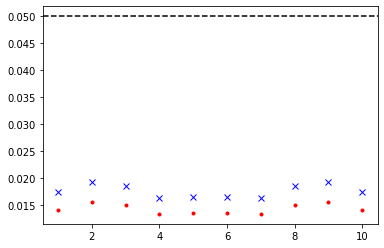

In [218]:
covX = np.linalg.pinv(FX + FpriorX)
j = 0
k = 0
for i, p in enumerate(pnamesX):
    if 'xstretch' in p:
        print(p, np.sqrt(covX[i,i]))
        j += 1.
        plt.plot(j, np.sqrt(covX[i,i]), 'r.')
    
    if 'ystretch' in p:
        print(p, np.sqrt(covX[i,i]))
        k += 1.
        plt.plot(k, np.sqrt(covX[i,i]), 'bx')
plt.axhline(0.05, color='k', ls='dashed')

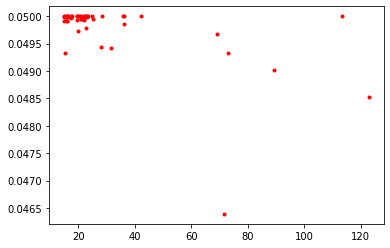

In [219]:
covX = np.linalg.pinv(FX + FpriorX)

# Plot point source flux vs forecast flux factor
for i in range(50):
    
    pn = "flux_factor_%06d" % i
    j = pnamesX.index(pn)
    
    plt.plot(modelX.ptsrc_flux[0,i], np.sqrt(covX[j,j]), 'r.')
    